In [86]:
import pandas as pd
# set up
%pylab inline
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objects as go
import re

Populating the interactive namespace from numpy and matplotlib


In [144]:
import string, itertools
from collections import Counter, defaultdict
from nltk.text import Text
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize, sent_tokenize, regexp_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from wordcloud import WordCloud
from gensim.corpora.dictionary import Dictionary
from gensim.models.tfidfmodel import TfidfModel
from sklearn.cluster import KMeans


In [3]:
# Your mapbox token
mapbox_access_token = 'pk.eyJ1Ijoia3Nha2V0IiwiYSI6ImNrMm93djBwejBnM3czbnFxYmdxYW81cXcifQ.xY3xrV7xc5HL5mHh185Tig'

In [18]:
states = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

In [71]:
df_level1_data = pd.read_csv('Level1_data.csv')
df_stage3 = pd.read_csv('stage3.csv')

In [52]:
df_level1_data.head()

,Incident ID,Incident Date,State,City Or County,Address,# Killed,# Injured,Operations,Incident Type
0,271363,"December 29, 2014",Louisiana,New Orleans,Poydras and Bolivar,0,4,View Incident View Source,mass-shootings
1,269679,"December 27, 2014",California,Los Angeles,8800 block of South Figueroa Street,1,3,View Incident View Source,mass-shootings
2,270036,"December 27, 2014",California,Sacramento,4000 block of May Street,0,4,View Incident View Source,mass-shootings
3,269167,"December 26, 2014",Illinois,East St. Louis,2500 block of Summit Avenue,1,3,View Incident View Source,mass-shootings
4,268598,"December 24, 2014",Missouri,Saint Louis,18th and Pine,1,3,View Incident View Source,mass-shootings


In [53]:
level1_states = df_level1_data['State']

In [54]:
level1_state_code =[]
for state in level1_states : 
    level1_state_code.append(list(states.keys())[list(states.values()).index(state)])

In [55]:
level1_data['State Code']=level1_state_code

In [56]:
level1_data.head()

,Incident ID,Incident Date,State,City Or County,Address,# Killed,# Injured,Operations,Incident Type,State Code
0,271363,"December 29, 2014",Louisiana,New Orleans,Poydras and Bolivar,0,4,View Incident View Source,mass-shootings,LA
1,269679,"December 27, 2014",California,Los Angeles,8800 block of South Figueroa Street,1,3,View Incident View Source,mass-shootings,CA
2,270036,"December 27, 2014",California,Sacramento,4000 block of May Street,0,4,View Incident View Source,mass-shootings,CA
3,269167,"December 26, 2014",Illinois,East St. Louis,2500 block of Summit Avenue,1,3,View Incident View Source,mass-shootings,IL
4,268598,"December 24, 2014",Missouri,Saint Louis,18th and Pine,1,3,View Incident View Source,mass-shootings,MO


In [57]:
ser = level1_data.groupby('State Code').count()['Incident ID']

In [58]:
new = pd.DataFrame({'State Code':ser.index,'Count':ser.data})

C:\Users\kumar\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Series.data is deprecated and will be removed in a future version



In [59]:
new.head()

,State Code,Count
0,AK,11
1,AL,183
2,AR,54
3,AZ,46
4,CA,440


In [61]:
fig = go.Figure(data=go.Choropleth(
    locations=new['State Code'], # Spatial coordinates
    z = new['Count'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Number of incidents",
))

fig.update_layout(
    title_text = 'Gun Violence Incidents in USA',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [66]:
df_level1_data.groupby('Incident Type').count()

,Incident ID,Incident Date,State,City Or County,Address,# Killed,# Injured,Operations
Incident Type,,,,,,,,
accidental-deaths,450,450,450,450,422,450,450,450
accidental-injuries,450,450,450,450,410,450,450,450
children-injured,450,450,450,450,435,450,450,450
children-killed,450,450,450,450,432,450,450,450
mass-shootings,2125,2125,2125,2125,2125,2125,2125,2125
officer-involved-shootings,36,36,36,36,35,36,36,36
teens-injured,450,450,450,450,441,450,450,450
teens-killed,450,450,450,450,438,450,450,450


In [84]:
characteristics = df_stage3['incident_characteristics'].str.lower()

In [85]:
characteristics

0         shot - wounded/injured||mass shooting (4+ vict...
1         shot - wounded/injured||shot - dead (murder, a...
2         shot - wounded/injured||shot - dead (murder, a...
3         shot - dead (murder, accidental, suicide)||off...
4         shot - wounded/injured||shot - dead (murder, a...
                                ...                        
239672                            shots fired - no injuries
239673    shot - dead (murder, accidental, suicide)||ins...
239674                               shot - wounded/injured
239675            shot - dead (murder, accidental, suicide)
239676    shot - dead (murder, accidental, suicide)||sui...
Name: incident_characteristics, Length: 239677, dtype: object

In [141]:
characteristics_str=''
for entry in characteristics :
    transformed_old = re.sub('[,()-]', '', str(entry))
    transformed_new = re.sub('[/||]',' ',transformed_old)
    characteristics_str+=transformed_new

In [142]:
characteristics_str

'shot  wounded injured  mass shooting 4+ victims injured or killed excluding the subject suspect perpetrator one location  possession guns found during commission of other crimes  possession of gun by felon or prohibited personshot  wounded injured  shot  dead murder accidental suicide  mass shooting 4+ victims injured or killed excluding the subject suspect perpetrator one location  gang involvementshot  wounded injured  shot  dead murder accidental suicide  shots fired  no injuries  bar club incident  in or around establishmentshot  dead murder accidental suicide  officer involved incident  officer involved shooting  subject suspect perpetrator killed  drug involvement  kidnapping abductions hostage  under the influence of alcohol or drugs only applies to the subject suspect perpetrator shot  wounded injured  shot  dead murder accidental suicide  suicide^  murder suicide  attempted murder suicide one variable unsuccessful  domestic violenceshot  dead murder accidental suicide  home i

In [145]:
tokenized_char = word_tokenize(characteristics_str)

In [149]:
tokenized_char = [word for word in tokenized_char if word not in stopwords.words('english') if word != "shot"]

In [150]:
# Lemmatizataion
lmtzr = WordNetLemmatizer()
tokenized_words = [lmtzr.lemmatize(word) for word in tokenized_char]
print(tokenized_words)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



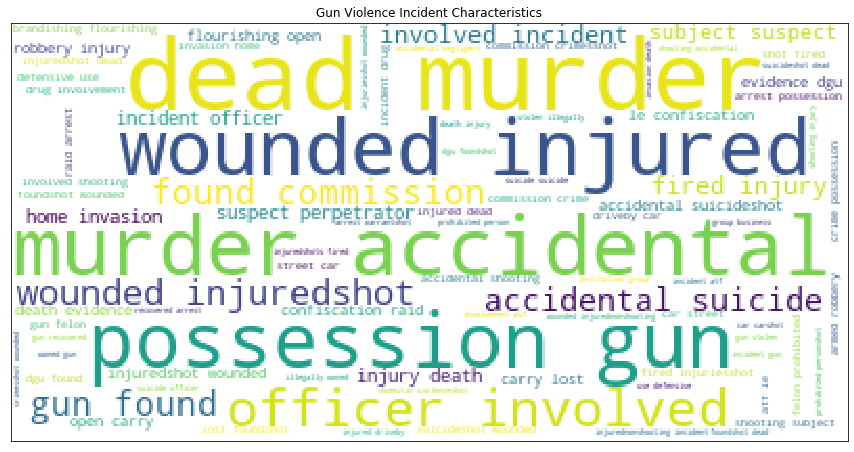

In [152]:
# Word Cloud
wc = WordCloud(background_color='white').generate(' '.join(tokenized_words))
plt.figure(figsize=(15,15))
plt.xticks([])
plt.yticks([])
plt.imshow(wc)
plt.title('Gun Violence Incident Characteristics');